## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [ ]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.4/798.4 kB 4.1 MB/s eta 0:00:00


## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=0)$ (white class))?

Q2: Give the means and variances of the two classes.

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: We have two classes, $P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=0)$ (white class), each following a Gaussian distribution, with estimated means ($m_0$ and $m_1$) and variances ($\sigma^2_0$ and $\sigma^2_1$) as following:
$$
P(Y_s = y_s | X_s = 0) = \frac{1}{\sqrt{2 \pi \sigma^2_0}} \exp\left(-\frac{(y_s - m_0)^2}{2 \sigma^2_0}\right)
$$
$$
P(Y_s = y_s | X_s = 1) = \frac{1}{\sqrt{2 \pi \sigma^2_1}} \exp\left(-\frac{(y_s - m_1)^2}{2 \sigma^2_1}\right)
$$

A2:

- For class 0:

Mean ($m_0$): 96.79765395894428

Variance ($\sigma^2_0$): 514.1174138509301

- For class 1:

Mean ($m_1$): 163.87755102040816

Variance ($\sigma^2_1$): 512.7315368596419

In the following, the variances will be assumed to be equal, $\sigma^2 = 2\frac{\sigma^2_0 \sigma^2_1}{\sigma^2_0 + \sigma^2_1}$

the conditional probability can be expressed by the normal distribution for each class:

$$
P(Y_s = y_s | X_s = 0) = \frac{1}{\sqrt{2 \pi \sigma^2}} \exp\left(-\frac{(y_s - m_0)^2}{2 \sigma^2}\right)
$$
$$
P(Y_s = y_s | X_s = 1) = \frac{1}{\sqrt{2 \pi \sigma^2}} \exp\left(-\frac{(y_s - m_1)^2}{2 \sigma^2}\right)
$$


## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3: We have 4 nodes:

- 1 node corresponds to Class 0 (source).
- 1 node corresponds to Class 1 (sink).
- 2 nodes correspond to each of the neighbouring pixel in the image.

The data attachment terms correspond to the arcs between the source and each pixel for Class 0 ($D(0,y_p)$ and $D(0,y_t)$), as well as between the sink and each pixel for Class 1 ($D(1,y_p)$ and $D(1,y_t)$).

Here, $D(0,y_p) = w(p, s) = (y_p - m_0)^2$ and $D(1,y_p) = w(p, t) = (y_p - m_1)^2$.

The regularization term corresponds to the arc between the pixel nodes and has a value of $\beta$. $w(p, q) = \beta$.

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

In the last lab session, we formulated the local conditional energy as follows:

$$ U_s = U^{\text{data}}_s + U^{\text{reg}}_s = -\ln(P(Y_s = y_s | X_s = x_s)) + \beta \sum_{t \in V_s} \Delta(x_s, x_t) = \frac{(y_s - \mu_{x_s})^2}{2\sigma^2} + \beta \sum_{t \in V_s} \Delta(x_s, x_t) $$

Here, $V_s$ denotes the neighboring pixels of $s$ in 4-connectivity.

We determined that the optimal value for $\beta_{\text{best}}$ in the Iterated Conditional Modes (ICM) algorithm is 2.(the results are shown below).

Therefore, in this lab, as we expressed the data attachment term as:

$$ U^{\text{data}}_s = (y_s - \mu_{x_s})^2 $$

We are selecting $\beta_{\text{best}} = 2 \cdot 2\sigma^2$.


## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5:
By completing the provided program outline below, we sought the optimal value of $\beta$, denoted as $\beta_{opt}$ₜ, using the "true image" $x$ corresponding to IoriginalBW.png. Plotting the curve of error values between $x$ and the estimated $\hat x$ allowed us to identify the optimal 𝛽 value as:

$$\beta_{opt} = 1.7\cdot 2\sigma^2 = 1745.64$$

This value strikes an ideal balance between regularization and data attachment terms, ensuring a precise estimation of the original image.




Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6:

Graph Cut Optimization vs. ICM:

- Graph cut optimization aims for a global optimum, while ICM focuses on local improvements.
- Graph cut optimization might be computationally more demanding, especially for large graphs, whereas ICM can be more efficient.
- Graph cut optimization is often suitable for segmentation tasks, while ICM is more general-purpose and adaptable to various optimization problems.
- Graph cut optimization might be more robust for problems with a well-defined global structure, while ICM's performance can depend on the specifics of the problem and initialization.

Graph Cut Optimization vs. Simulated Annealing:
- Simulated Annealing is known for its ability to explore a broader solution space, while graph cut optimization tends to exploit local structures within the graph.
- Graph cut optimization is well-suited for problems that can be represented as graphs, especially those with a clear structure. Simulated Annealing is more versatile and applicable to a wide range of optimization problems.
- Graph cut optimization may be computationally efficient for certain problems, while Simulated Annealing might demand more computational resources.
- Simulated Annealing's probabilistic nature can make it robust in escaping local minima, while the effectiveness of graph cut optimization may depend on the quality of the graph representation.




Q7: How can you explain that the error rate with the true image can be lower with the simulated annealing result or the ICM than with the graph-cut optimisation?
  

**Your answer &#x270D;**

A7:
Graph cut algorithms provides optimal solutions (gloabl minimums) according to the provided graph model (in our case the Ising model) or the constraints used (in our case $\beta$) . So if the graph model and the constraints do not accurately represent the real structure of the image, it can lead to suboptimal results comparing to the real image.

Q8: What are the advantages and disadvantages of the Ising model?


**Your answer &#x270D;**

A8:

Advantages:
Simplicity:

- The Ising model is relatively simple and mathematically tractable.
- The model can be used to model textures in images, capturing statistical dependencies between neighboring pixels. This is particularly useful for analyzing textures in certain regions of images.
- The binary nature of the Ising model, where pixels are assigned binary values can be advantageous for capturing binary patterns or distinct regions in an image.
- It incorporates local interactions between neighboring pixels, making it suitable for tasks where the relationship between adjacent elements is essential, such as image segmentation.

Disadvantages:
- The binary representation of the Ising model might oversimplify the information contained in grayscale or color images, limiting its ability to capture the richness of visual information.
- The model primarily focuses on local interactions, which might not be sufficient for capturing global features or long-range dependencies in complex images.
- The performance of the model in image analysis can be sensitive to the choice of parameters, such as interaction strengths or boundary conditions, and finding optimal parameter values might be challenging.


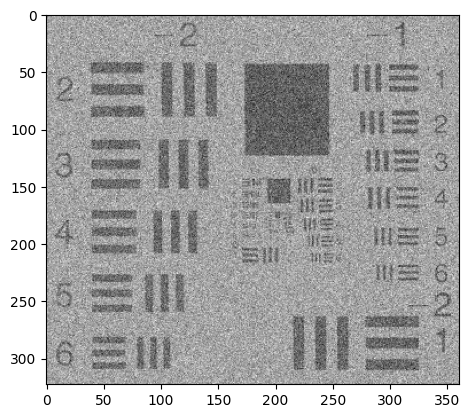

In [ ]:
# Loading images
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

plt.imshow(im_obs,cmap='gray')

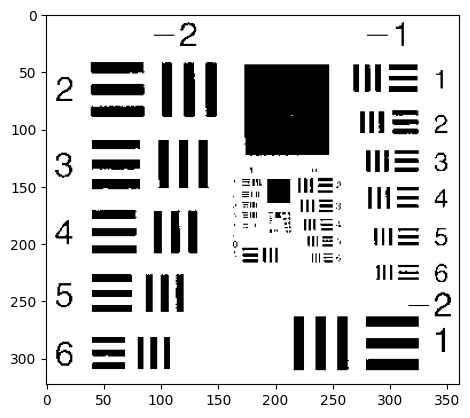

In [ ]:
plt.imshow(im_orig, cmap='gray')

In [ ]:
# defining varaince
var0 = np.var(im_obs[50:81,175:241])
var1 = np.var(im_obs[230:300,130:200])
var = 2 * var0 * var1/(var0  + var1)

In [ ]:
#### to be completed
# TO BE COMPLETED EX1
beta = 2 * (2 * var)  # beta value
print(beta)
m0 = np.mean(im_obs[50:81,175:241]) # m0 and m1 values from the previous practical work
m1 = np.mean(im_obs[230:300,130:200])
print(m0,m1)
## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, (im_obs-m0)**2, (im_obs-m1)**2)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


2053.6941605495513
96.79765395894428 163.87755102040816
Max Flow: 78719590.08253041


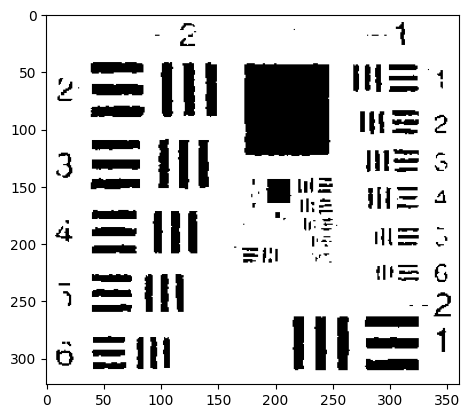

In [ ]:
plt.imshow(im_bin,cmap='gray')

In [ ]:
im_orig * 1

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

In [ ]:
im_bin

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

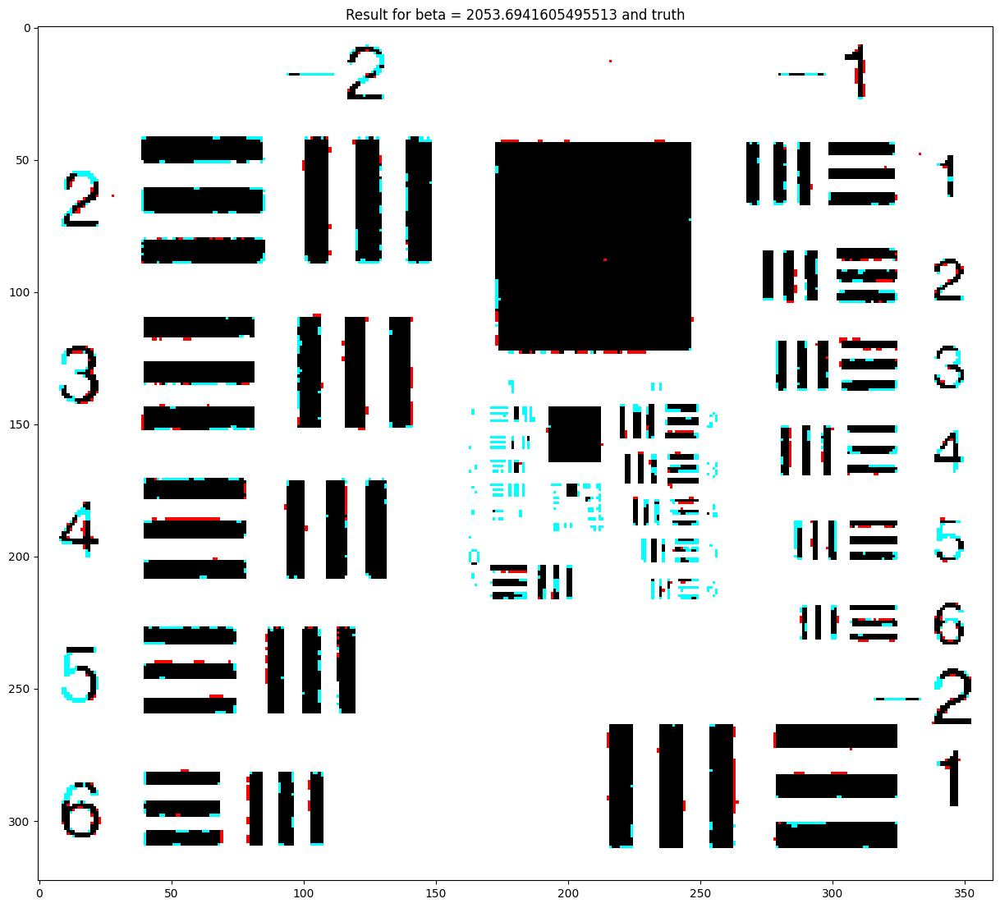

Number of misclassified pixels for beta =  2053.6941605495513 :  2271


In [ ]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig*1))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

## Result with ICM

In [ ]:
# ICM function
def iter_icm(im_bin,im_toclass,beta_reg,m0,m1):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
            # do not change these indices they allow access to neighboring pixels
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

            # energy computation if the pixel is put in class 0
            U0 = (im_toclass[i,j] - m0)**2/(2*var)  + beta_reg *(im_bin[i1,j] + im_bin[i2,j] + im_bin[i,j1] + im_bin[i,j2])

            # energy computation if the pixel is put in class 1
            U1 = (im_toclass[i,j] - m1)**2/(2*var)  + beta_reg*(4 - (im_bin[i1,j] + im_bin[i2,j] + im_bin[i,j1] + im_bin[i,j2]))

            if (U0<U1):
                im_bin[i,j]=0
            else :
                im_bin[i,j]=1

    return im_bin

In [ ]:
# ICM algorithm to be implemented

#initialise the binary image of the classes
threshold = (m0 + m1)/2
im_bin_ICM = (im_obs.copy() > threshold)*1


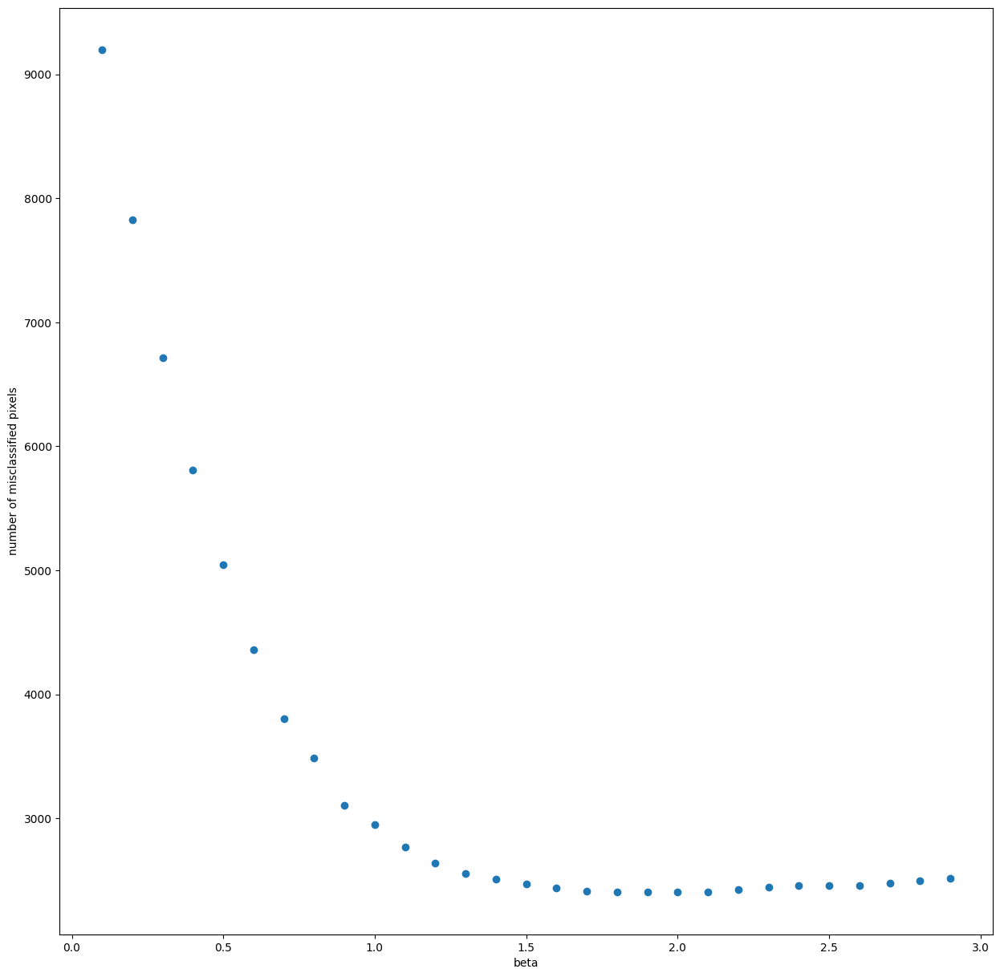

Best beta value:  2.0


In [ ]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
beta_range = [i/10 for i in range(1,30)]
for beta in beta_range:
    im_bin_ICM = (im_obs.copy() > threshold)*1
    for n in range(10):
      im_bin_ICM = iter_icm(im_bin_ICM,im_obs,beta,m0,m1)

    # compute the error
    error =  np.sum(np.abs(im_bin_ICM - im_orig*1))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta_ICM = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta_ICM)

In [ ]:
#initialise the binary image of the classes
threshold = (m0 + m1)/2
im_bin_ICM = (im_obs.copy() > threshold)*1
for n in range(100):
      im_bin_ICM = iter_icm(im_bin_ICM,im_obs,best_beta_ICM,m0,m1)


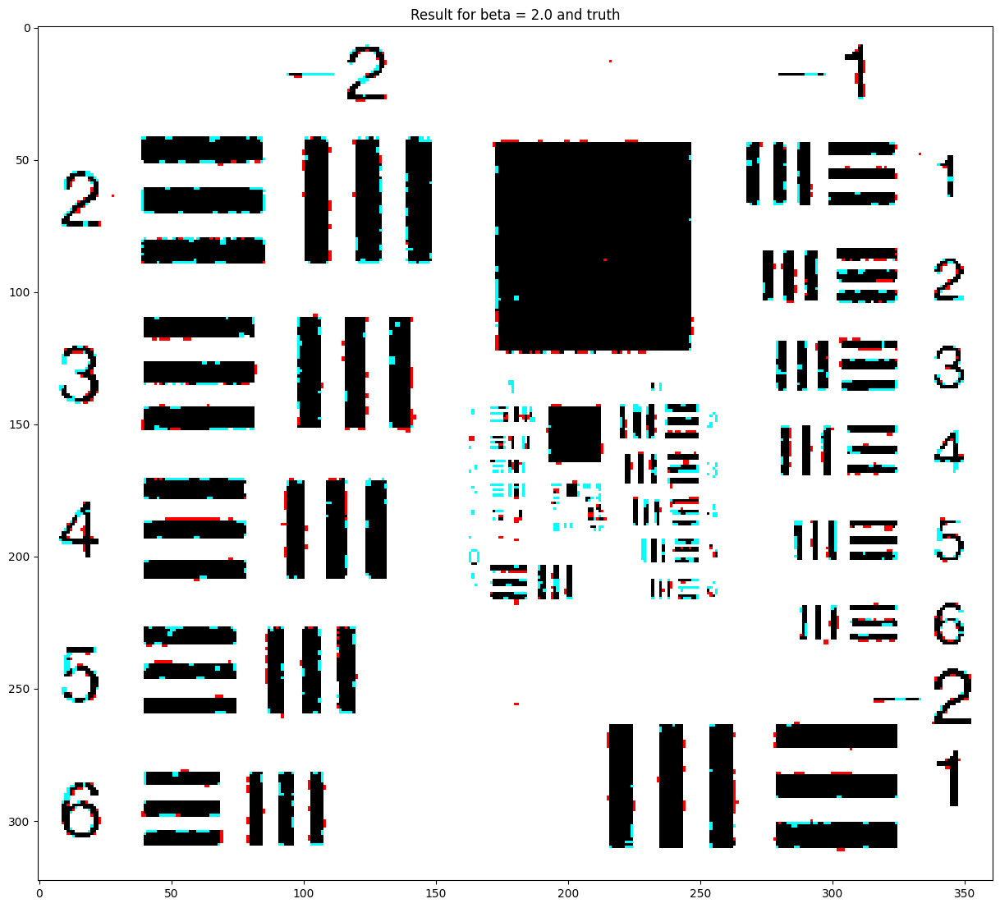

Number of misclassified pixels for beta =  2.0 :  2404


In [ ]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin_ICM - im_orig*1))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin_ICM, im_bin_ICM))*255)
plt.title("Result for beta = " + str(best_beta_ICM) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",best_beta_ICM,": ",int(error))

## Result with simulated annealing

In [ ]:
# simulated annealing function
def echan_r(im_bin,im_toclass,beta_reg,m0,m1,T):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):

            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]


            U0=(im_toclass[i,j] - m0)**2/(2*var)  + beta_reg *(im_bin[i1,j] + im_bin[i2,j] + im_bin[i,j1] + im_bin[i,j2])

            p0=math.exp(-U0/T);

            U1= (im_toclass[i,j] - m1)**2/(2*var)  + beta_reg*(4 - (im_bin[i1,j] + im_bin[i2,j] + im_bin[i,j1] + im_bin[i,j2]))

            p1=math.exp(-U1/T);

            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0
                else :
                    im_bin[i,j]= 1

    return im_bin

In [ ]:
alpha = 0.98
T = 5
beta_SA = best_beta_ICM
im_bin_SA = (np.random.rand(*im_obs.shape) > 0.5) * 1
for n in range(100):
    im_bin_SA = echan_r(im_bin_SA,im_obs,best_beta_ICM,m0,m1,T)
    T=T * alpha

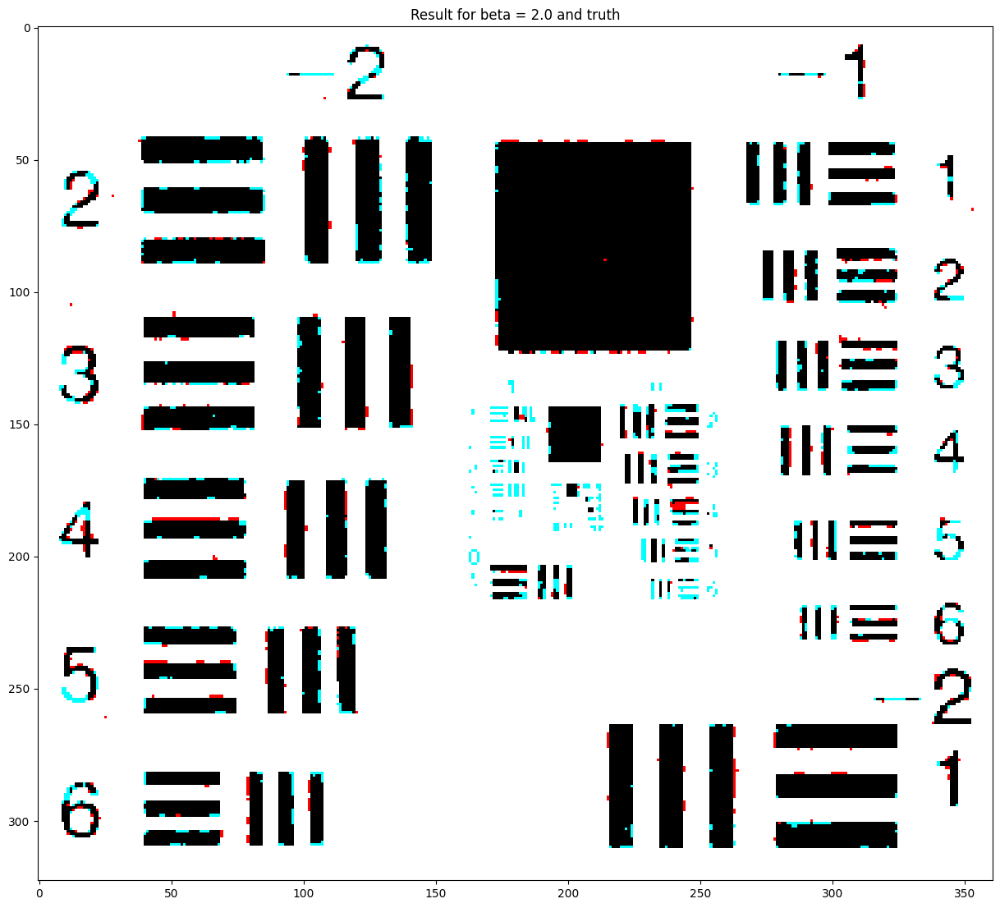

Number of misclassified pixels for beta =  2.0 :  2364


In [ ]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin_SA - im_orig*1))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin_SA, im_bin_SA))*255)
plt.title("Result for beta = " + str(beta_SA) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta_SA,": ",int(error))

### Search for the best parameter $\beta$

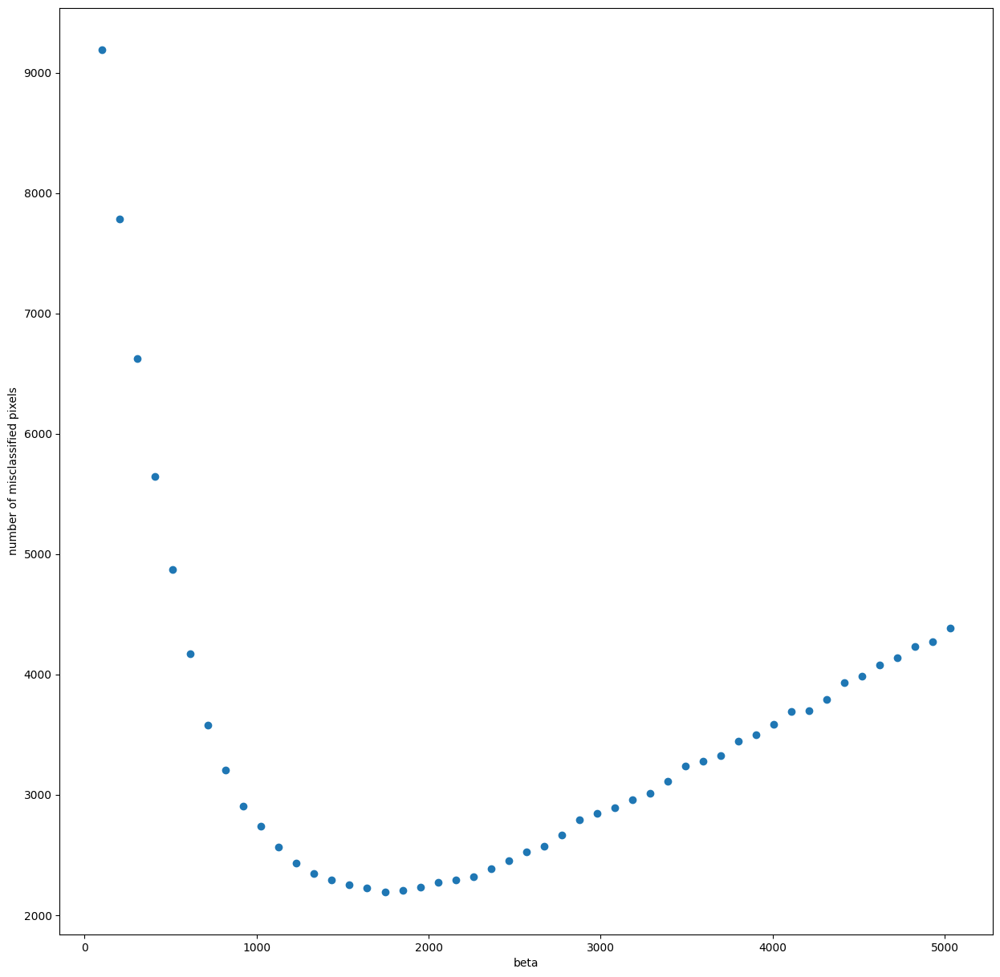

Best beta value:  1745.6400364671185


In [ ]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
beta_range = [i/10 * 2 * var for i in range(1,50)]
for beta in beta_range:
    # TO BE COMPLETED
    m0 = np.mean(im_obs[50:81,175:241]) # m0 and m1 values from the previous practical work
    m1 = np.mean(im_obs[230:300,130:200])

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    g.add_grid_tedges(nodeids,(im_obs-m0)**2, (im_obs-m1)**2)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    #TO BE COMPLETED
    error =  np.sum(np.abs(im_bin - im_orig*1))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

In [ ]:
# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, best_beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, (im_obs-m0)**2, (im_obs-m1)**2)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

Max Flow: 76181179.41174589


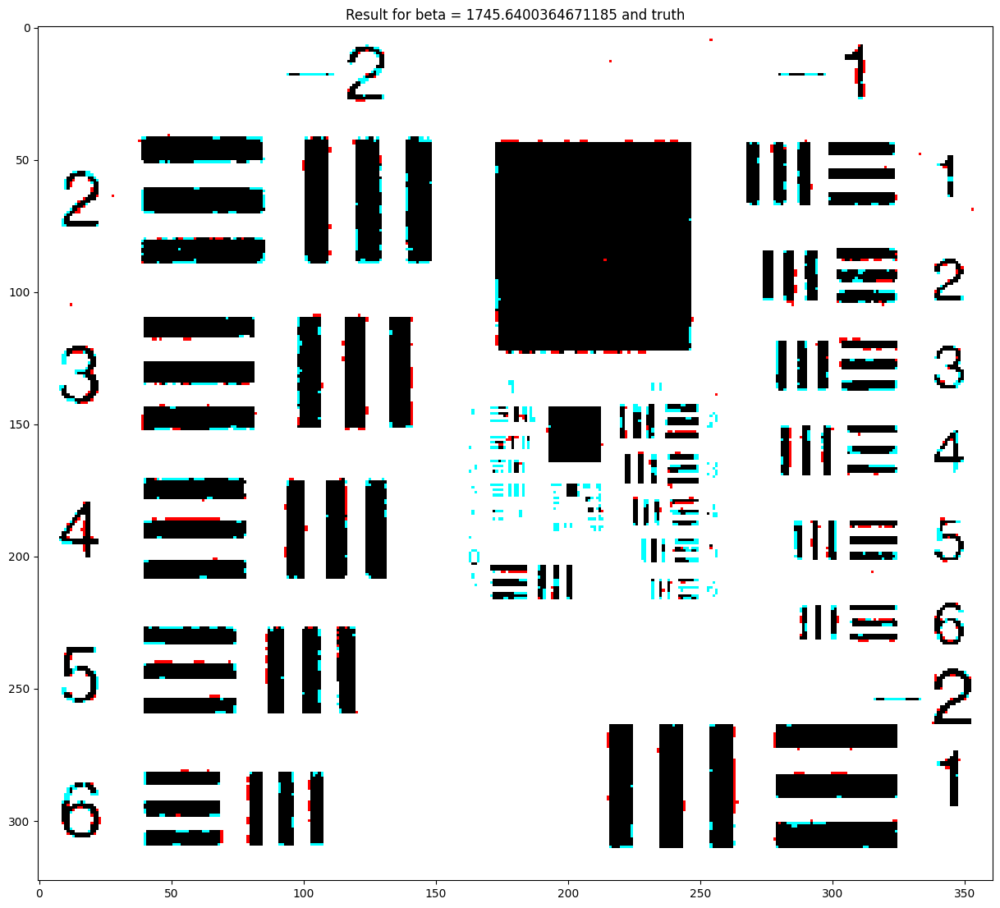

Number of misclassified pixels for beta =  1745.6400364671185 :  2190


In [ ]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig*1))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(best_beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",best_beta,": ",int(error))

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:

We begin by calculating the mean values for the plane and sky classes in each color channel, extending the Ising model to three dimensions. Gaussian distributions model background (sky) and object (planes) properties separately for each channel. The data attachment term is formulated using squared differences, assuming no correlation between color components.

In the regularization phase, we experiment with different values for the parameter beta. The graph is then constructed with 3D data attachment, incorporating quadratic distances to mean values for terminal edges. The minimal cut is computed to classify pixels into object and background.

The chosen beta parameter effectively balances precision and spatial smoothness. Although minor classification errors are noted, particularly at plane edges, they are considered acceptable.

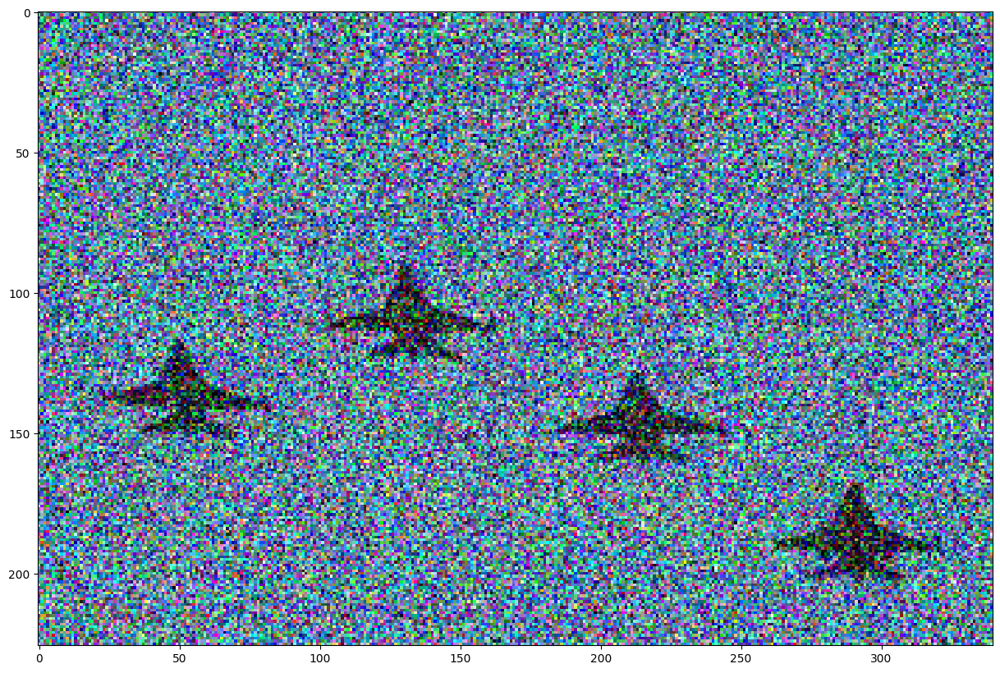

In [ ]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()


In [ ]:
im_planes.shape

(226, 340, 3)

#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1

In [ ]:
plane_class = im_planes[180:200,280:300,:]
sky_class = im_planes[0:100,150:300,:]

In [ ]:
# mean of the plane class - 3D vector
# TO BE COMPLETED
m_planes = [np.mean(plane_class[:,:,i]) for i in range(3)]

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = [np.mean(sky_class[:,:,i]) for i in range(3)]

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [93.96126666666666, 127.14426666666667, 156.2286]
For the planes, [R,G,B] =  [53.645, 56.4725, 70.2075]


For the planes, [R,G,B] =  [53.645  56.4725 70.2075]
For the sky, [R,G,B] =  [ 93.96126667 127.14426667 156.2286    ]


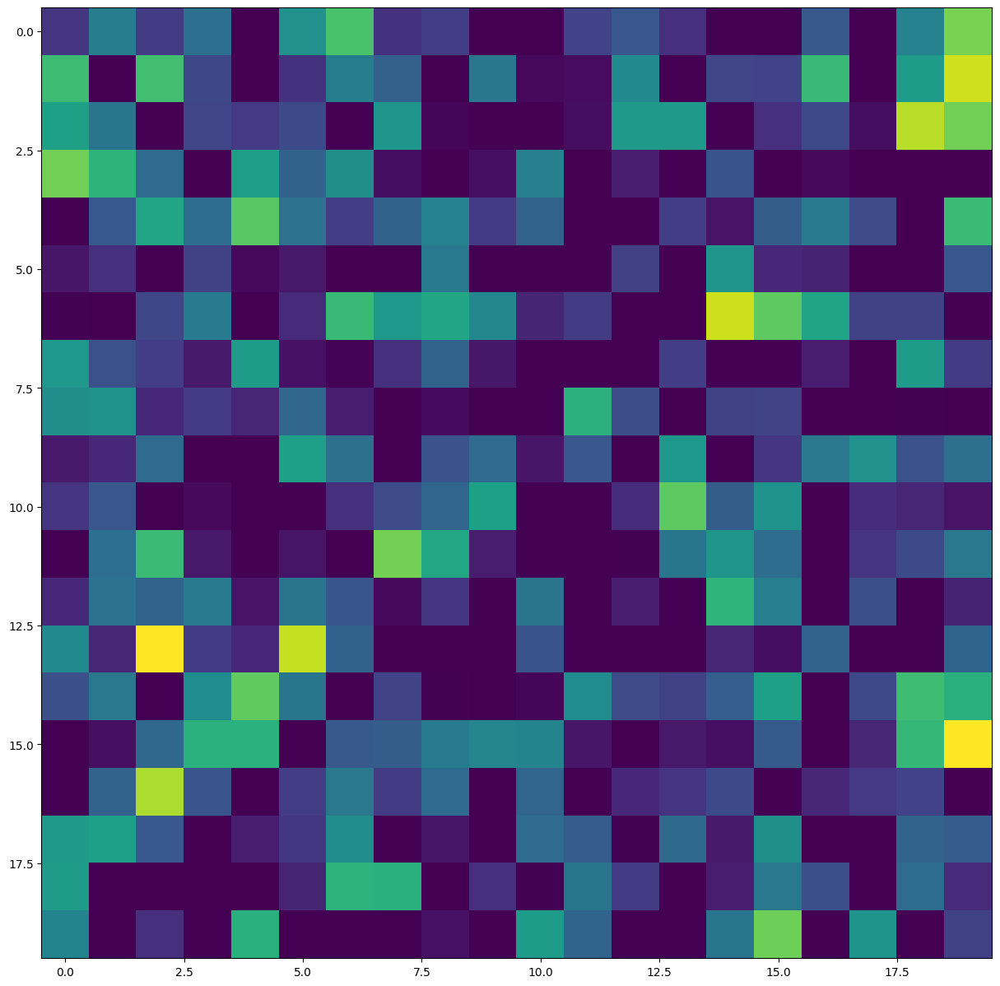

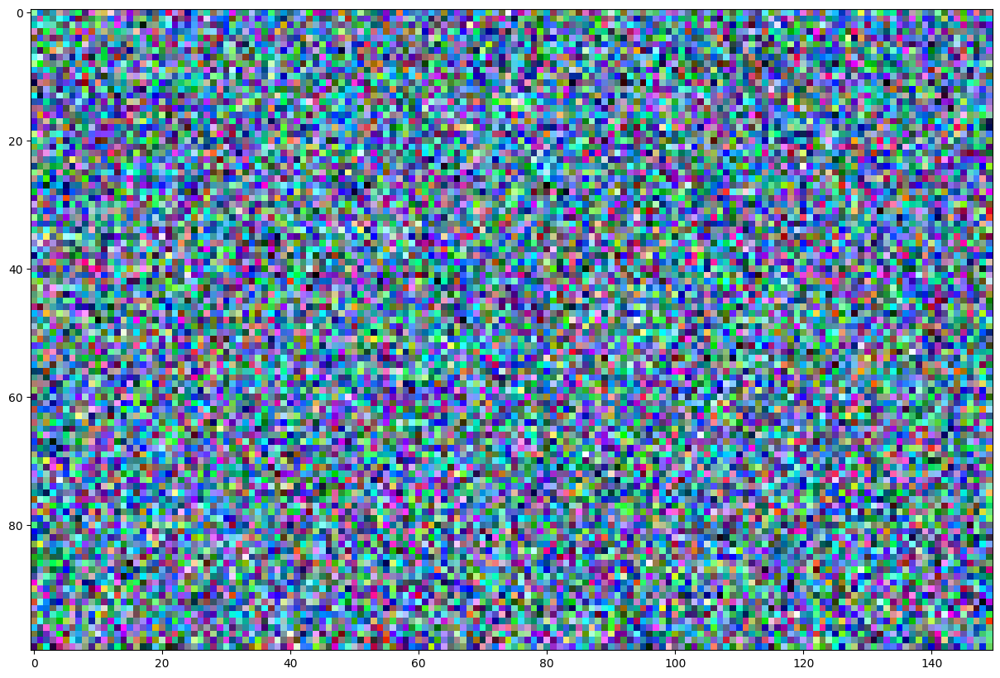

In [ ]:
# mean of the plane class - 3D vector
# TO BE COMPLETED
m_planes = np.mean(im_planes[180:200,280:300,:], axis = (0,1))

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = np.mean(im_planes[0:100,150:300], axis = (0,1))

print("For the planes, [R,G,B] = ", m_planes)
print('For the sky, [R,G,B] = ', m_sky)


# check that the obtained values are coherent
plt.imshow(im_planes[180:200,280:300,1])
plt.show()
plt.imshow(im_planes[0:100,150:300])
plt.show()

In [ ]:

#affiche(im_bin, titre="Result for beta = " + str(beta));
# choose a beta value
# TO BE COMPLETED
beta =  14000

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the quadratic distance to the mean value
# of each class

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, np.sum((im_planes - m_sky)**2, axis=2), np.sum((im_planes - m_planes)**2, axis=2))


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))






Max Flow: 1091223838.6492774


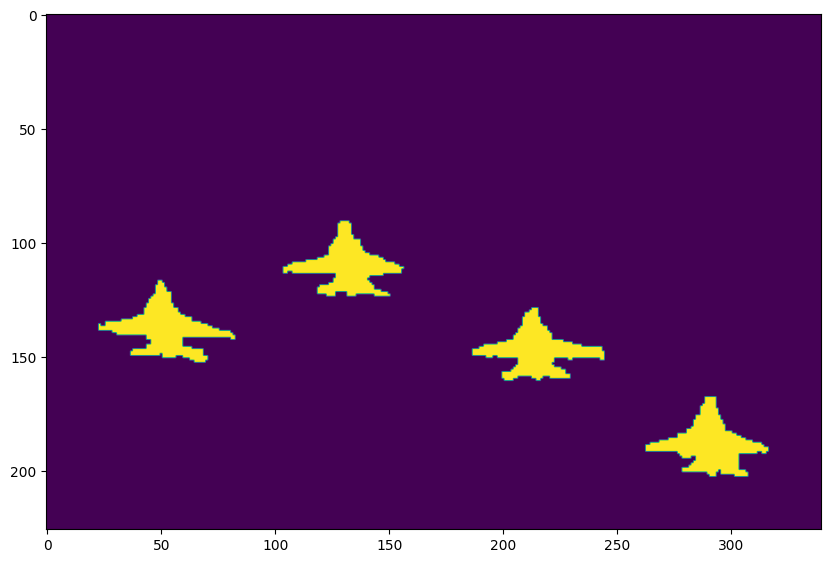

In [ ]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin)

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10:

Using boundary='symm' in convolution helps handle boundary effects by symmetrically extending the image, reducing artifacts at the edges. Without this option, the convolution operation introduces unwanted effects at the image boundaries.

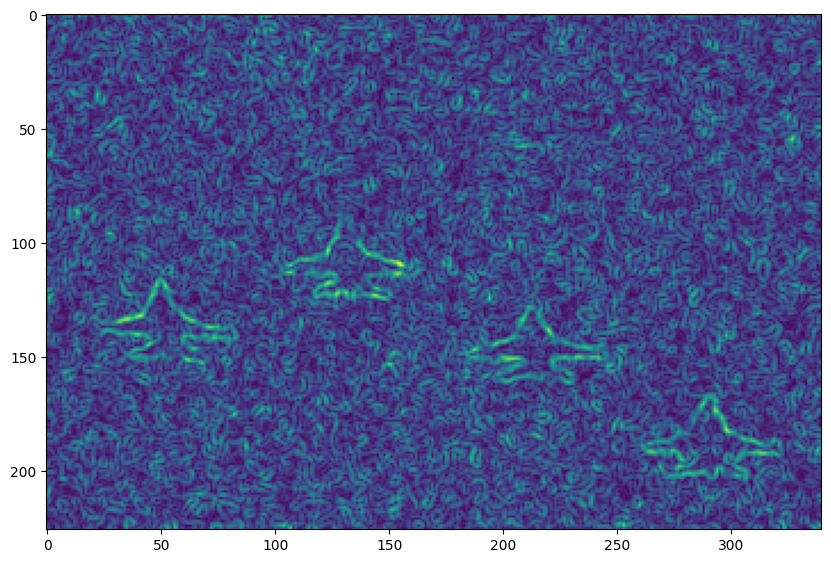

In [ ]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = scipy.signal.convolve2d(image, sobel_x, mode='same', boundary='symm')
    derivative_y = scipy.signal.convolve2d(image, sobel_y, mode='same', boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av)
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$ We can use $h=300$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11:  The use of the gradient term in CRF segmentation enhances results and improves contour detection. However due to the simplicity of the image, the difference is not be highly pronounced, yet CRF segmentation still outperforms binary graph cut.

Max Flow: 1096010178.2865467


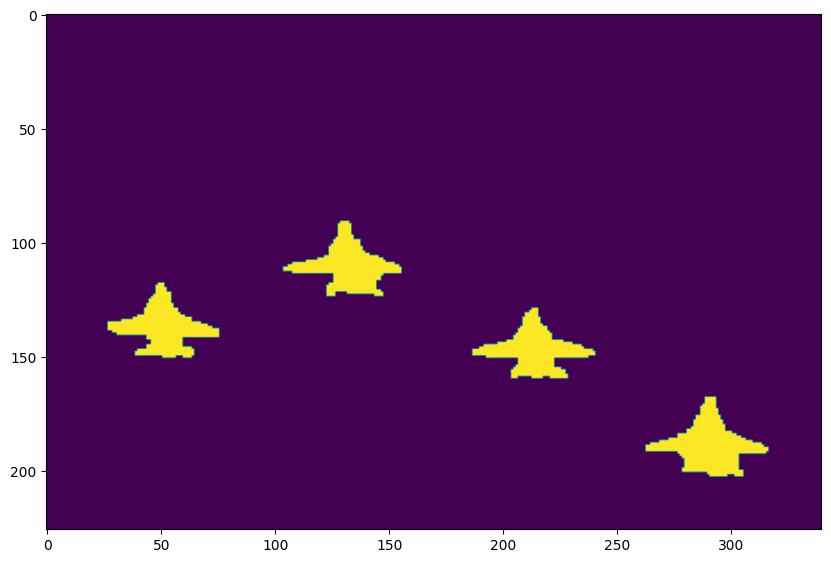

In [ ]:

# calcul de beta_field
# ce champ définira la valeur pour les 4-voisins
# TO BE COMPLETED
h = 300
beta2 = 20000
beta_field = beta2 * np.exp(- grad_av/h)

## Graph cut binaire
# compléter en reprenant votre code précédent et en remplaçant
# beta par beta_field dans la ligne g.add_grid_edges
g = maxflow.Graph[float]() #Instanciation du graph

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[0:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta_field)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, np.sum((im_planes - m_sky)**2, axis=2), np.sum((im_planes - m_planes)**2, axis=2))



# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

# Get the segments of the nodes in the grid.
#sgm = g.get_grid_segments(nodeids) # Renvoie 1 si le pixel est du coté du drain après calcul de la coupe min, 0 si il est du coté de la source
#im_bin = np.int_(np.logical_not(sgm))

plt.imshow(im_bin)

## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12:

No, it's not possible to segment the zebra with the method used to segment the planes. The prominent contrast in the zebra's black-and-white fur would likely result in a classification that divides these patterns rather than effectively distinguishing the zebra from the background.

uint8


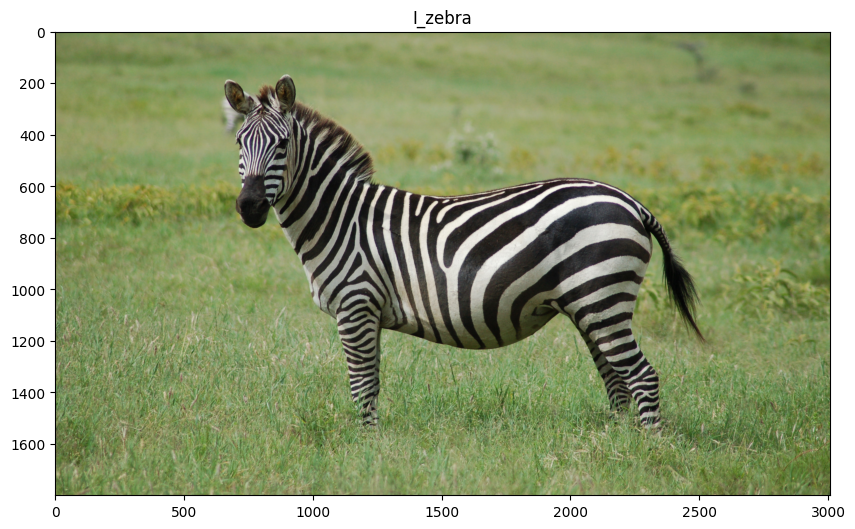

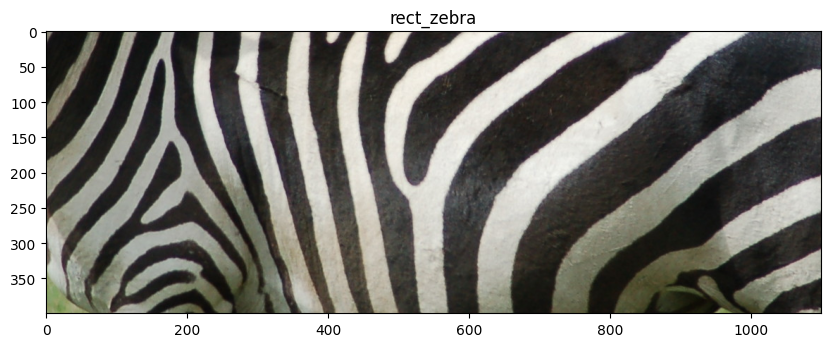

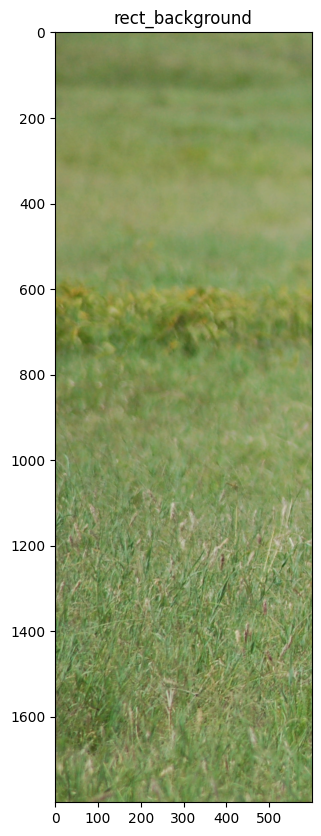

In [ ]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13:

The diagonal values in the covariance matrices indicate the variance for each color channel (R, G, B) in different regions—the full zebra image, zebra rectangle, and background rectangle. The zebra, black and white, exhibits similar variances across channels, emphasizing its unique color pattern. Conversely, the green background has a smaller variance, especially in the green component.

In [ ]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14:

The histograms for the zebra reveal two separate classes, corresponding to black and white, indicating color variations. Conversely, the background displays a single class across all three color channels, implying uniform color. This distinction underscores the color distribution differences between the zebra and the background in the "rect_zebra" image.







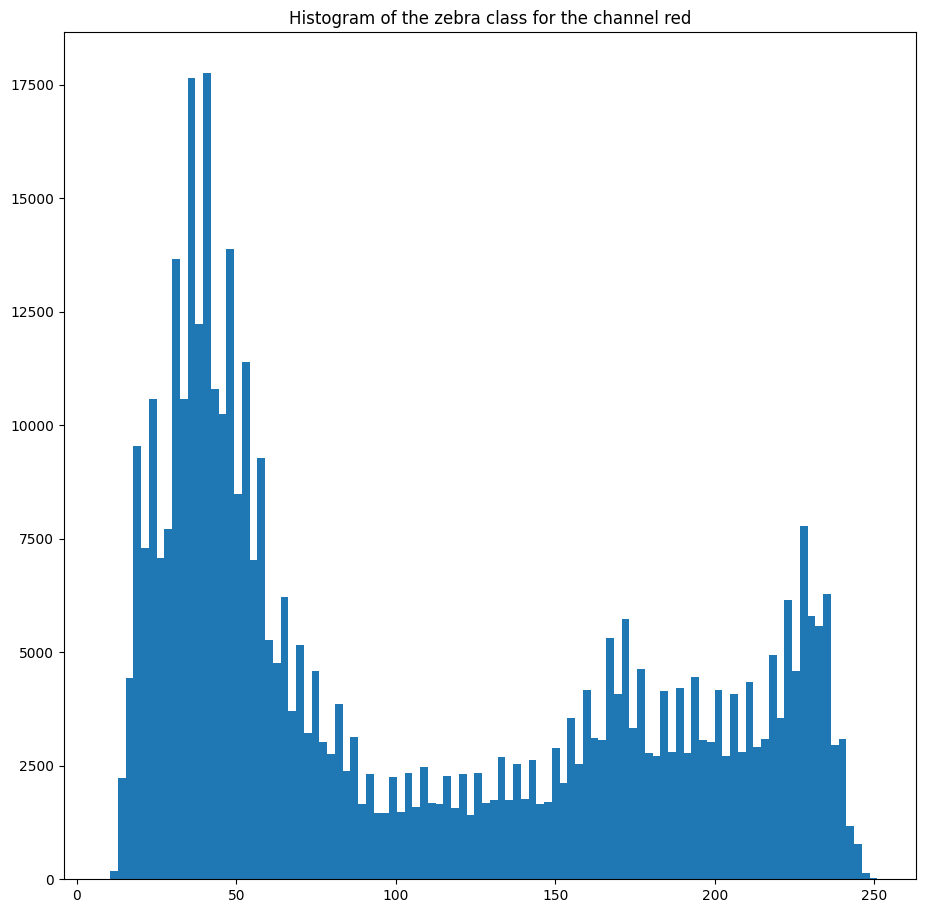

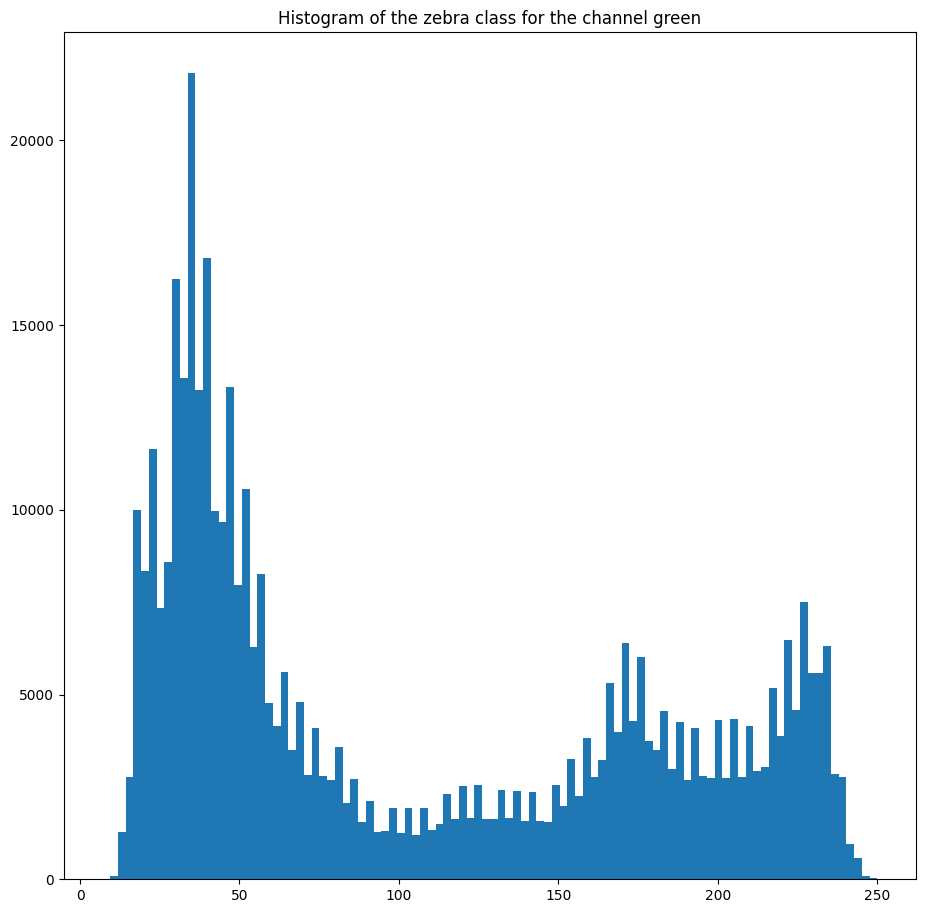

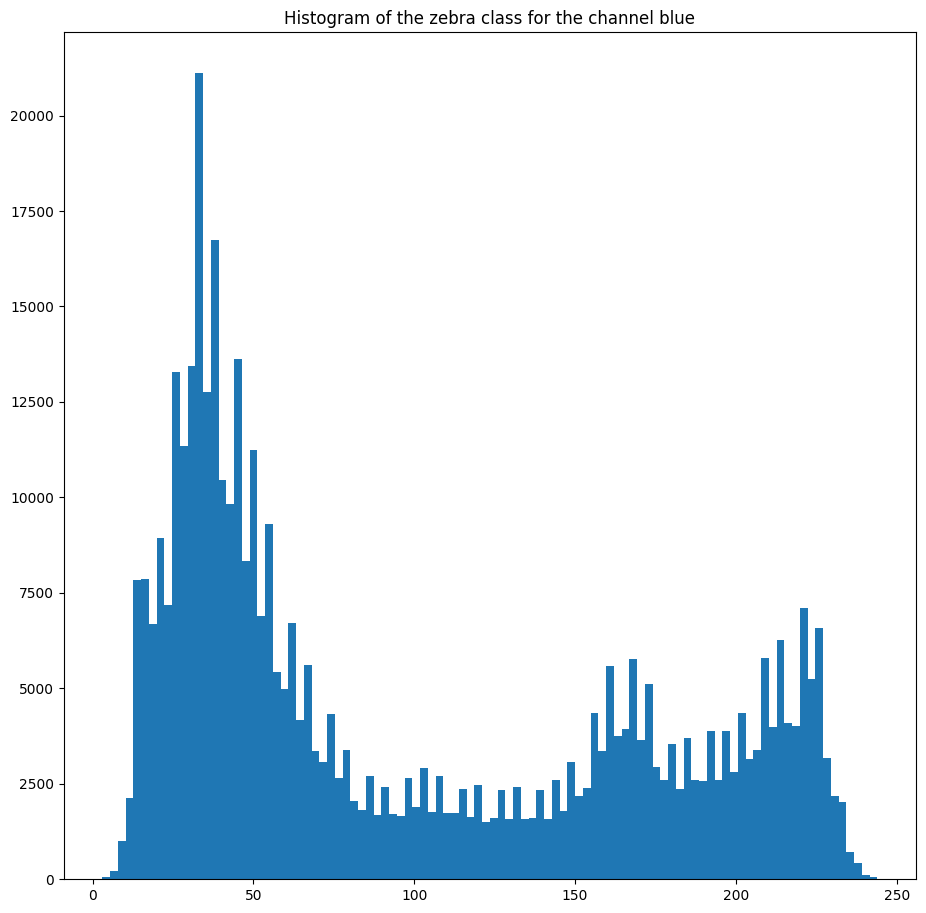

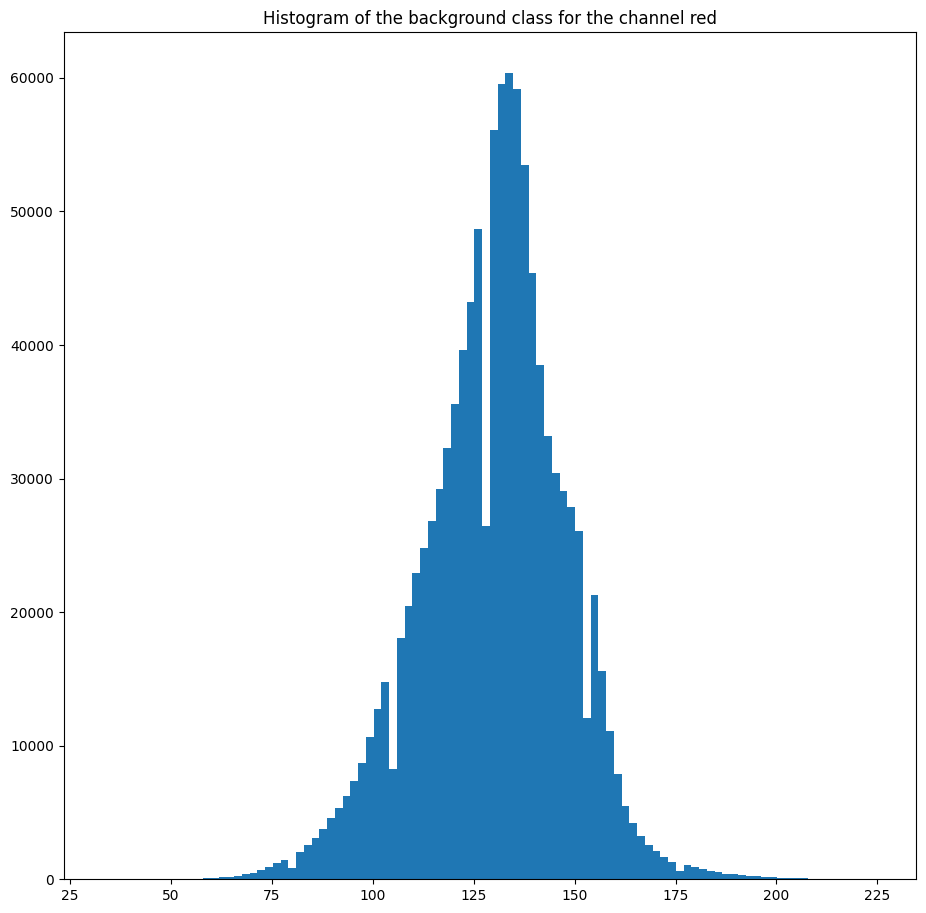

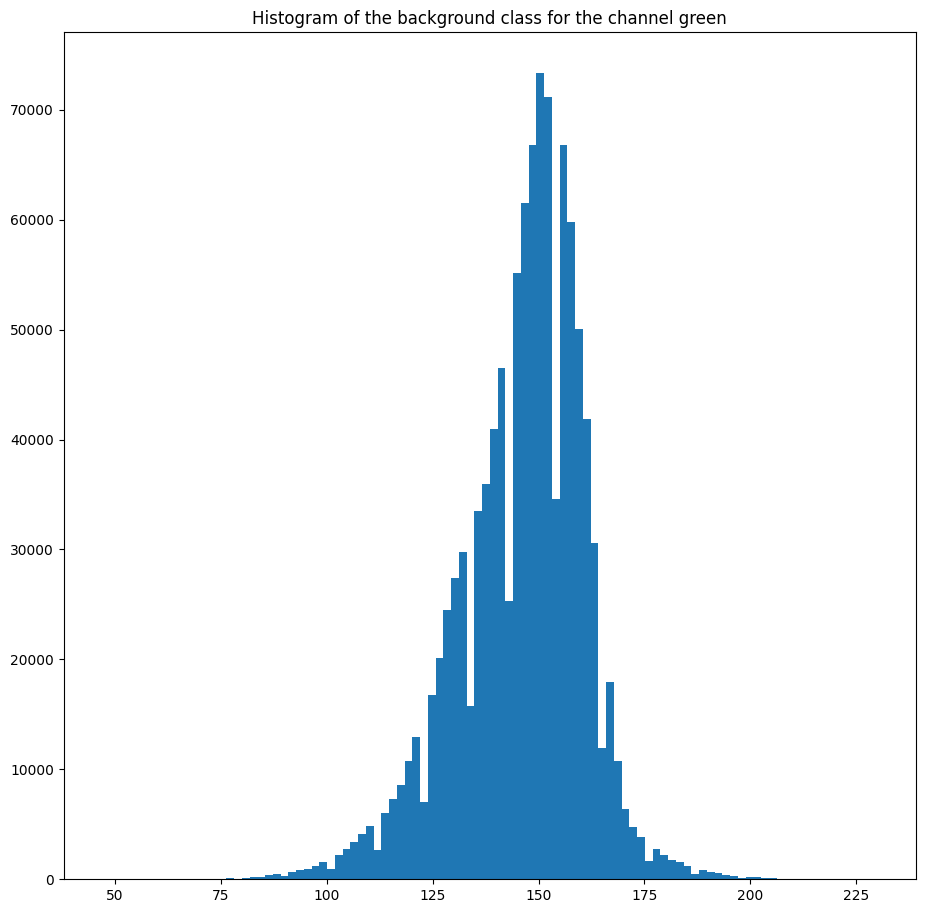

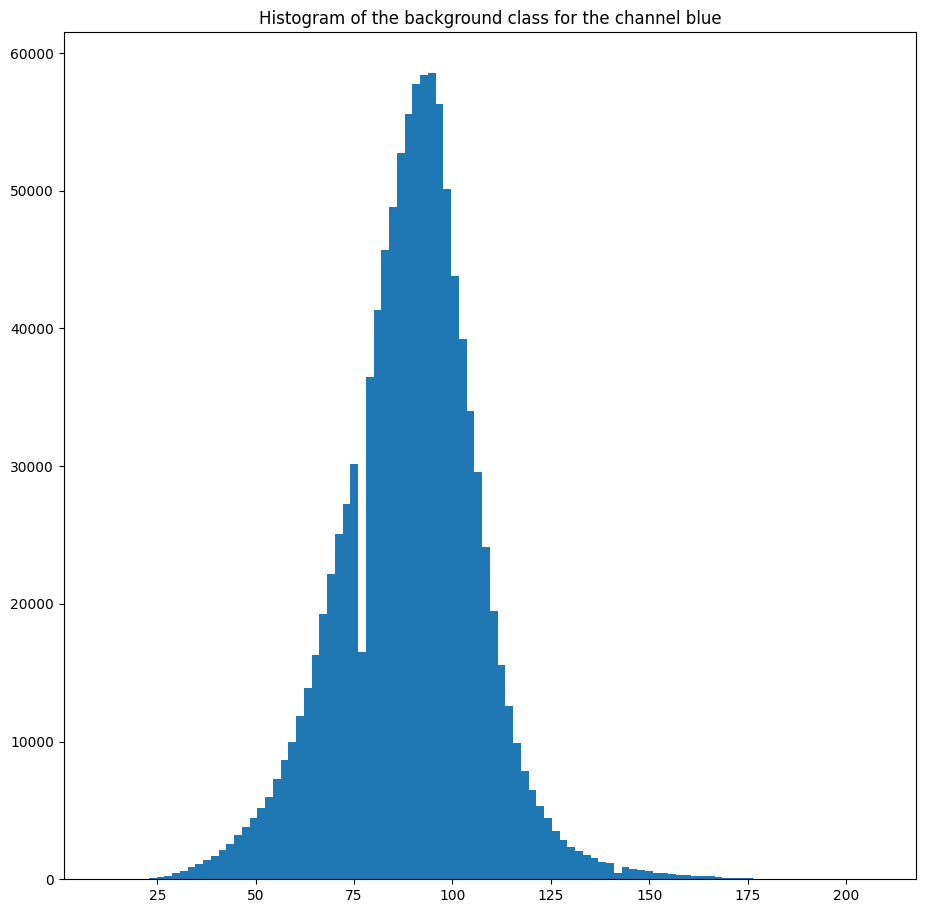

In [ ]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15: The average vectors obtained represent the centroids of the clusters determined by the KMeans clustering algorithm for both the zebra and background parts of the image. These vectors essentially capture the mean color values within their respective clusters. Visualizing these vectors as images shows the dominant colors in each area.

KMeans excels in highlighting color differences between clusters, as seen in the expected results for the zebra (black and gray) and the background (two shades of green)


In [ ]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


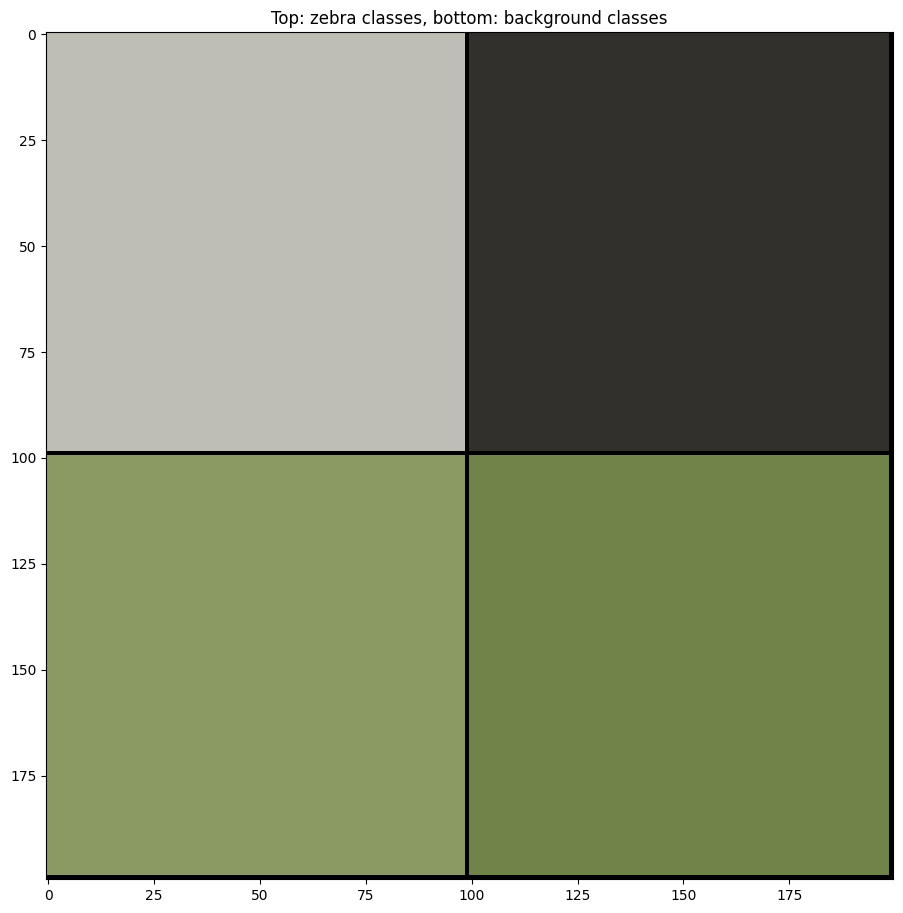

In [ ]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16:

The displayed images of neg-log-likelihood for the zebra classes highlight variations, with the minimum neg-log-likelihood image emphasizing subtle differences. In these results, a clear distinction between the zebra and background is evident, but certain areas, particularly along edges (attributed to the striped pattern), pose challenges for accurate classification. The neg-log-likelihood images effectively visualize differences in likelihood for each class. Similar observations are made for the background class, illustrating discriminative aspects between classes.

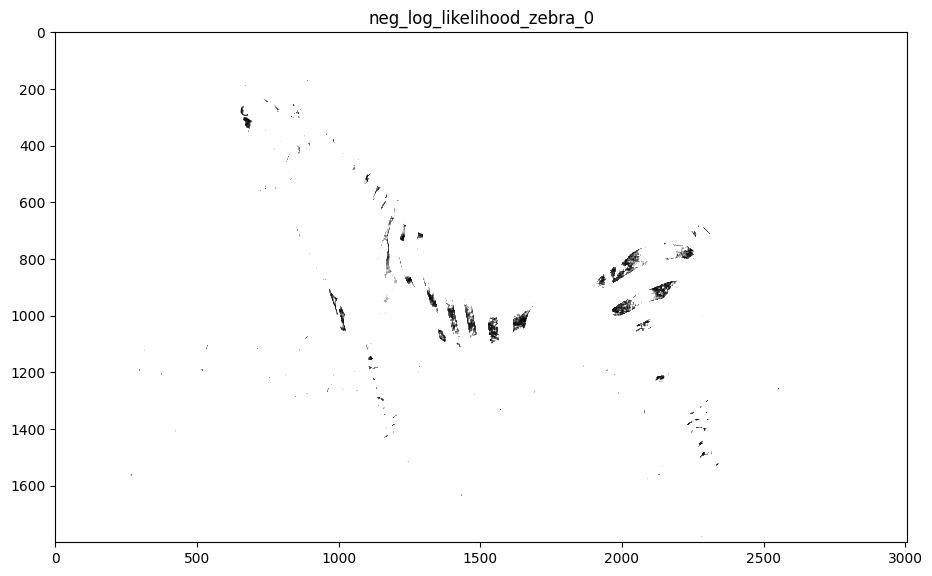

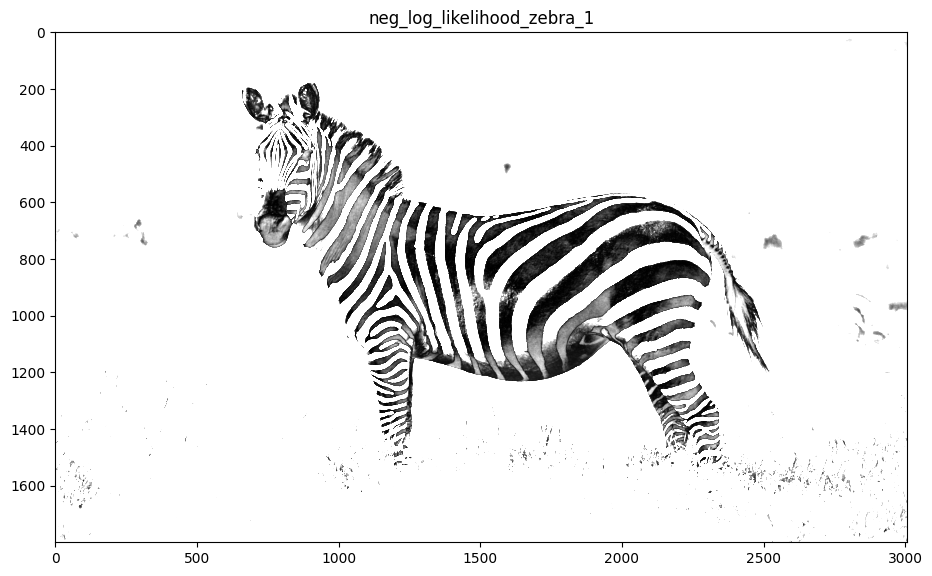

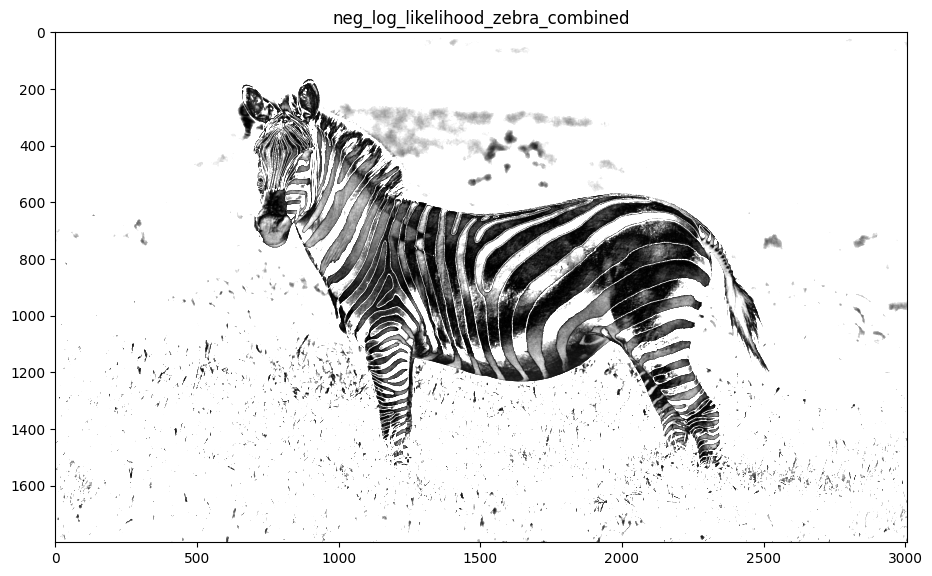

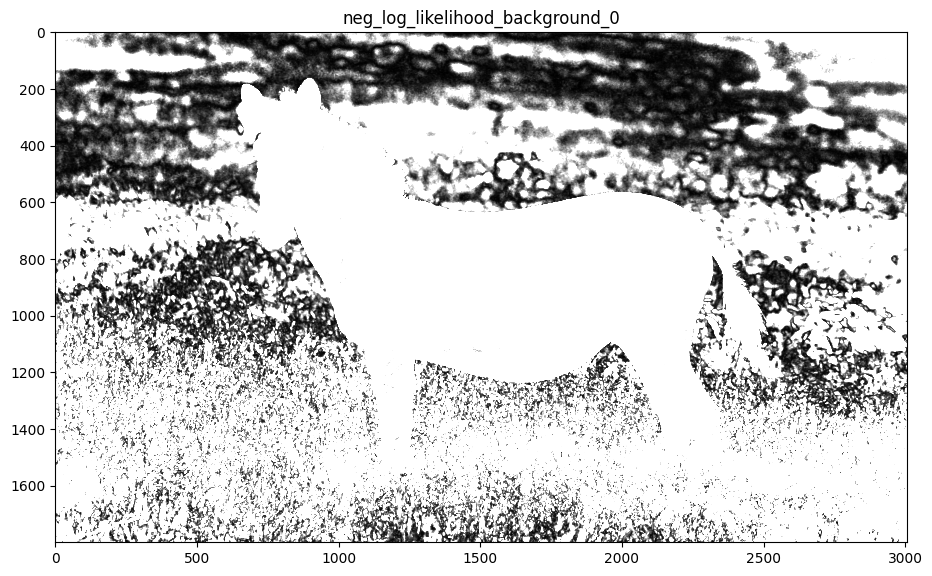

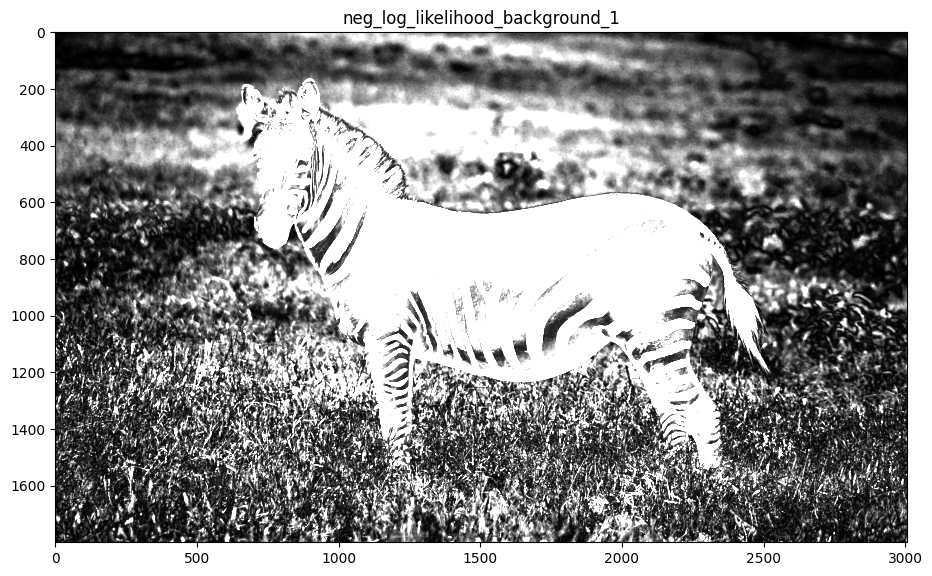

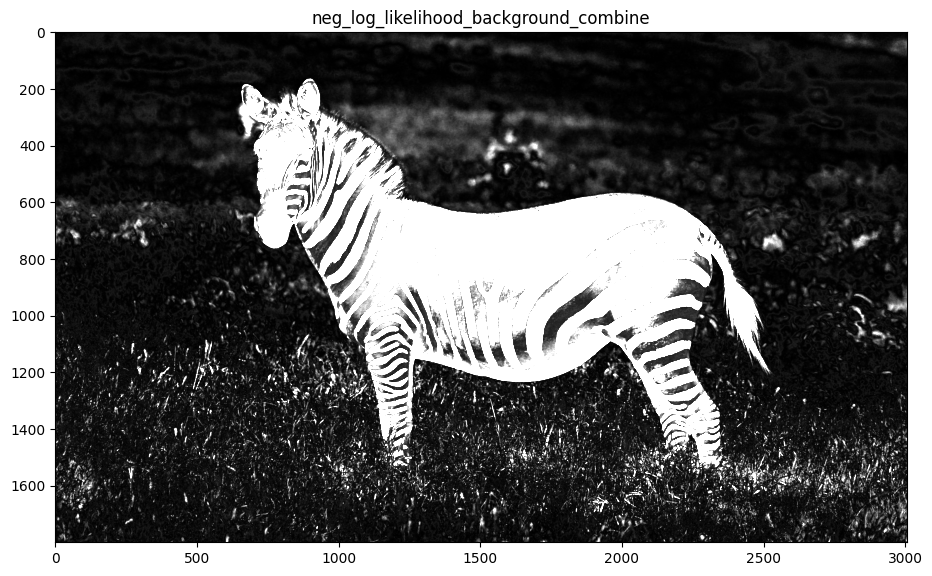

In [ ]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3)),sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3)))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
# call the output neg_log_likelihood_background_combined


neg_log_likelihood_background_0 = sum((I_zebra[:,:,i]- mean_vectors_background[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

neg_log_likelihood_background_combine = np.minimum(sum((I_zebra[:,:,i]- mean_vectors_background[0,i])**2 for i in range(3)),sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3)))

plt.figure()
plt.imshow(neg_log_likelihood_background_combine,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_combine")
plt.show()


Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17:
The outcome is satisfactory, accurately distinguishing the zebra from the background without misclassification within the zebra's stripes. Notably, there are some limitations along the zebra's edges, particularly around the ear and tail, where the segmentation accuracy slightly diminishes.

Max Flow: 7171469915.439856


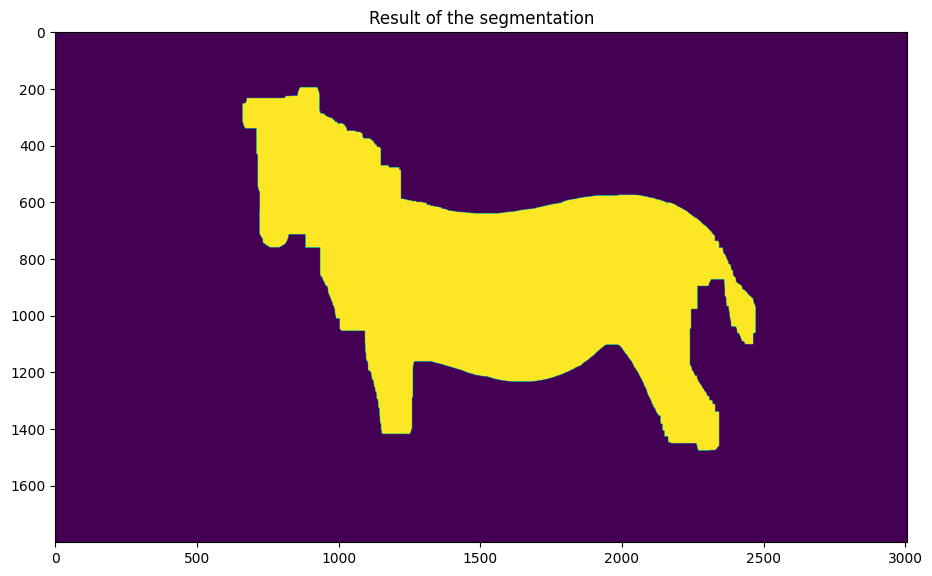

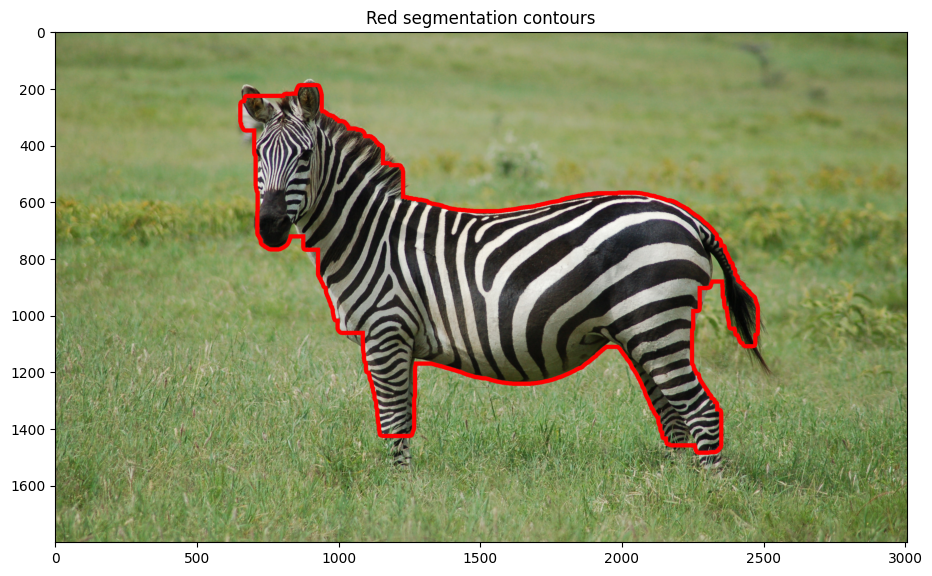

In [ ]:
beta = 240000 # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combine ,neg_log_likelihood_zebra_combined)


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18:

Using the segmentation, we found average vectors for 5 background and 5 zebra classes. Then, we made new images showing neg-log-likelihood combinations with these averages. The images turned out better than expected, making the contrast between the background and zebra more noticeable.

In [ ]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


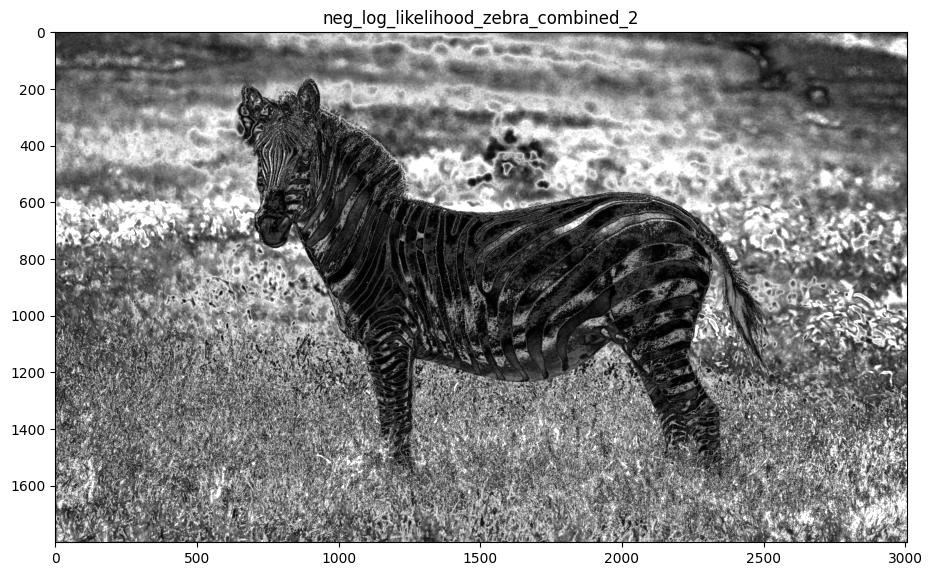

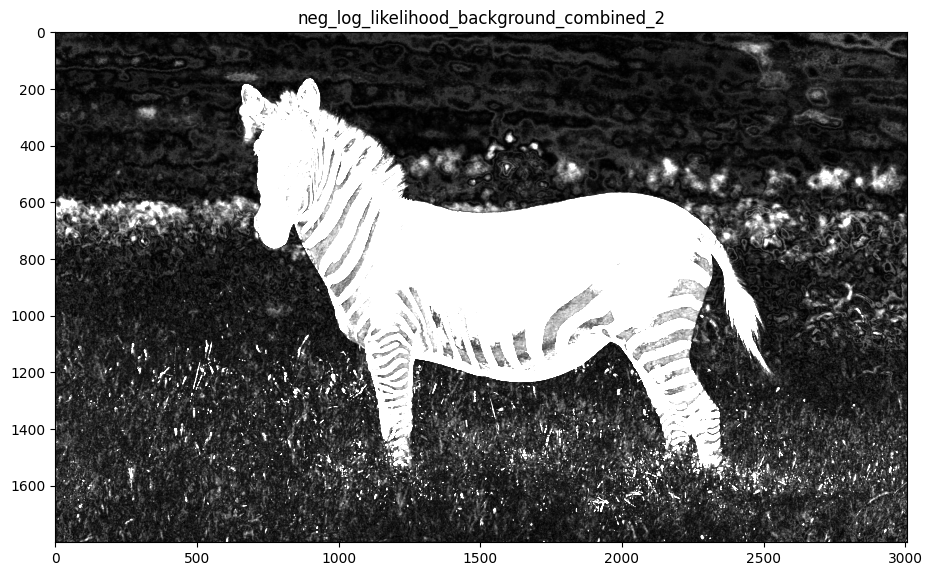

In [ ]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19:

The segmentation results for 5 classes outperform those for 2 classes, demonstrating minimal misclassifications along the edges.

Achieving success with a β value of 13000, as opposed to the previous 240000, highlights the need for a much milder regularization for favorable outcomes. This suggests that the data attachment terms were more aligned with producing satisfactory results.

Max Flow: 1463266266.3926601


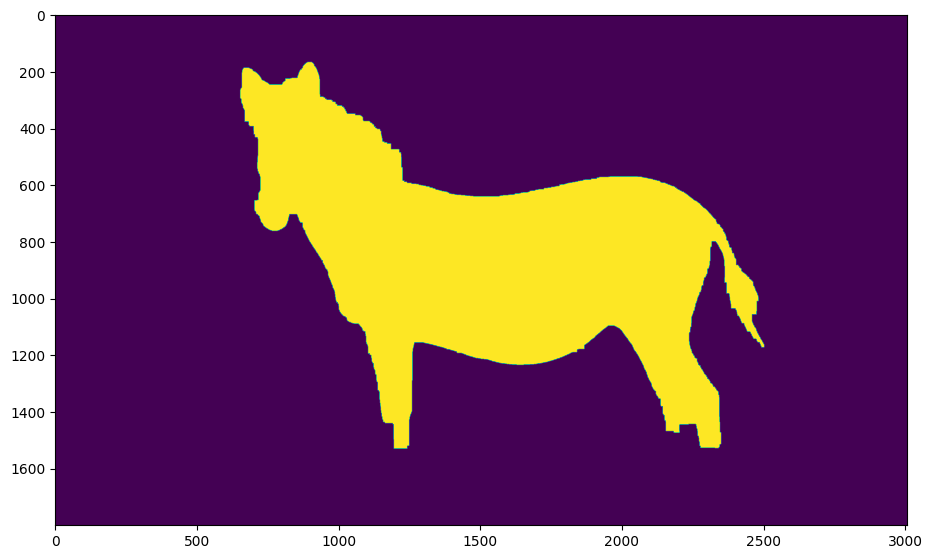

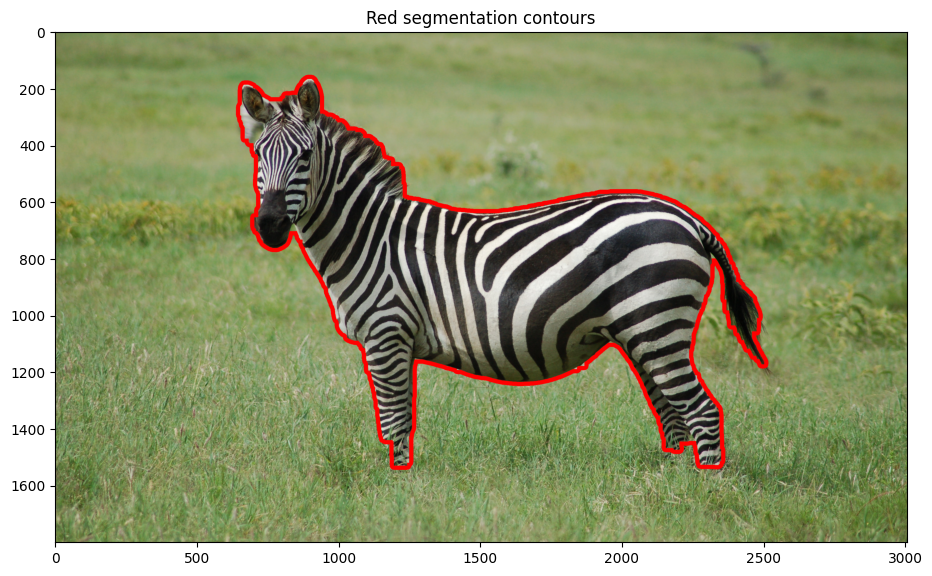

In [ ]:
beta = 13000 # Optimal beta value to be determined

g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()